In [580]:
!pip install dame_flame
!pip install stargazer

In [581]:
# Load libraries
import pandas as pd
import numpy as np
from scipy import stats
from plotnine import *
import dame_flame
import statsmodels.formula.api as smf
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from pathlib import Path
import altair

In [582]:
# Load datasets
fl = pd.read_csv('/content/listings_florida.csv.gz')
ca = pd.read_csv('/content/listings_california.csv.gz')



In [583]:
# Add county column to datasets
fl['county'] = 'FL'
ca['county'] = 'CA'

In [584]:
# List unecessary columns
columns_to_be_dropped = [
    "scrape_id",
    "listing_url",
    "name",
    "host_id",
    "description",
    "neighborhood_overview",
    "picture_url",
    "host_url",
    "host_name",
    "host_location",
    "host_about",
    "host_thumbnail_url",
    "host_picture_url",
    "host_neighbourhood",
    "host_listings_count",
    "host_verifications",
    "neighbourhood",
    "neighbourhood_cleansed",
    "neighbourhood_group_cleansed",
    "property_type",
    "bathrooms",
    "minimum_minimum_nights",
    "maximum_minimum_nights",
    "minimum_maximum_nights",
    "maximum_maximum_nights",
    "maximum_nights_avg_ntm",
    "calendar_updated",
    "availability_30",
    "availability_60",
    "availability_90",
    "calendar_last_scraped",
    "number_of_reviews",
    "reviews_per_month",
    "number_of_reviews_l30d",
    "first_review",
    "last_review",
    "license",
    "calculated_host_listings_count_entire_homes",
    "calculated_host_listings_count_private_rooms",
    "calculated_host_listings_count_shared_rooms",
    "host_total_listings_count",
    "last_scraped",
    "host_since",
    "host_response_rate",
    "availability_365",
    "minimum_nights_avg_ntm",
    "has_availability"
]


In [585]:
# Merge datasets into one
frames = [fl, ca]
listings = pd.concat(frames)

In [586]:
listings = listings.drop(columns_to_be_dropped, axis = 1)


In [587]:
listings

,id,host_response_time,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,latitude,longitude,room_type,accommodates,...,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,county
0,57818,within an hour,85%,f,t,t,26.016700,-80.124370,Entire home/apt,6,...,4.61,4.70,4.60,5.00,4.96,4.88,4.70,f,1,FL
1,69824,within an hour,60%,f,t,t,25.976410,-80.120520,Entire home/apt,6,...,4.00,5.00,5.00,5.00,4.00,5.00,4.00,f,2,FL
2,83449,within a few hours,92%,f,t,t,26.033920,-80.142010,Entire home/apt,5,...,4.74,4.84,4.84,4.89,4.89,4.79,4.89,f,8,FL
3,105411,within a day,0%,f,t,t,26.046780,-80.368090,Entire home/apt,5,...,5.00,5.00,5.00,5.00,5.00,4.25,5.00,f,1,FL
4,129061,within a few hours,26%,f,t,t,25.993320,-80.118870,Entire home/apt,7,...,4.65,4.78,4.56,4.61,5.00,4.61,4.50,f,6,FL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33324,53683908,within an hour,97%,f,t,t,34.105036,-118.341116,Entire home/apt,4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,5,CA
33325,53684062,within an hour,97%,f,t,t,34.062093,-118.245931,Entire home/apt,4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,5,CA
33326,53684370,within an hour,97%,f,t,t,34.060570,-118.248007,Entire home/apt,4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,5,CA
33327,53684541,within an hour,92%,f,t,t,34.101427,-118.348458,Entire home/apt,3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,11,CA


In [588]:
# Clean categorical variables
listings['host_response_time'] = np.where(listings['host_response_time'] == 'within an hour', 0, listings['host_response_time'])
listings['host_response_time'] = np.where(listings['host_response_time'] == 'within a few hours', 1, listings['host_response_time'])
listings['host_response_time'] = np.where(listings['host_response_time'] == 'within a day', 2, listings['host_response_time'])
listings['host_response_time'] = np.where(listings['host_response_time'] == 'a few days or more', 3, listings['host_response_time'])

listings['host_acceptance_rate'] = listings['host_acceptance_rate'].str.strip('%')

listings['host_is_superhost'] = np.where(listings['host_is_superhost'] == 't', 1, listings['host_is_superhost'])
listings['host_is_superhost'] = np.where(listings['host_is_superhost'] == 'f', 0, listings['host_is_superhost'])

listings['host_has_profile_pic'] = np.where(listings['host_has_profile_pic'] == 't', 1, listings['host_has_profile_pic'])
listings['host_has_profile_pic'] = np.where(listings['host_has_profile_pic'] == 'f', 0, listings['host_has_profile_pic'])

listings['host_identity_verified'] = np.where(listings['host_identity_verified'] == 't', 1, listings['host_identity_verified'])
listings['host_identity_verified'] = np.where(listings['host_identity_verified'] == 'f', 0, listings['host_identity_verified'])

listings['room_type'] = np.where(listings['room_type'] == 'Entire home/apt', 0, listings['room_type'])
listings['room_type'] = np.where(listings['room_type'] == 'Hotel room', 1, listings['room_type'])
listings['room_type'] = np.where(listings['room_type'] == 'Private room', 2, listings['room_type'])
listings['room_type'] = np.where(listings['room_type'] == 'Shared room', 3, listings['room_type'])

listings['essentials'] = listings['amenities']
listings['essentials'] = np.where(listings['essentials'].str.contains('Essential'), 1, listings['essentials'])
listings['essentials'] = np.where(listings['essentials'].str.contains('Essential') == False, 0, listings['essentials'])

listings['other_amenities'] = listings['amenities']
listings["other_amenities"] = np.where(
    listings["other_amenities"].str.contains("Essential") == False,
    listings["other_amenities"].apply(lambda x: len(x.split(","))),
    (
        np.where(
            listings["other_amenities"].str.contains("Essential") == True,
            listings["other_amenities"].apply(lambda x: len(x.split(",")) - 1),
            listings["other_amenities"],
        )
    ),
)

# listings['has_availability'] = np.where(listings['has_availability'] == 't', 1, listings['has_availability'])
# listings['has_availability'] = np.where(listings['has_availability'] == 'f', 0, listings['has_availability'])

listings['instant_bookable'] = np.where(listings['instant_bookable'] == 't', 1, listings['instant_bookable'])
listings['instant_bookable'] = np.where(listings['instant_bookable'] == 'f', 0, listings['instant_bookable'])

listings['bathrooms_text'] = listings['bathrooms_text'].str.split(" ").str[0]
listings["bathrooms_text"] = np.where(
    listings["bathrooms_text"] == "Private",
    1,
    (
        np.where(
            listings["bathrooms_text"] == "Shared",
            1,
            np.where(
                listings["bathrooms_text"] == "Half-bath",
                1,
                listings["bathrooms_text"],
            ),
        )
    ),
)

listings['price'] = listings['price'].str.strip('$')
listings['total_bookings'] = listings['number_of_reviews_ltm'] * 100/67


In [589]:
# Add decisions to be taken across NA columns
na_treatments = {
    'host_since': "drop rows", #only 4 unique hosts, with a lot of ther nas in other columns as well
    'host_response_time': "drop rows", #No relationship with other variables found yet. Very important variable, do not want to impute.
    'host_response_rate': "drop rows", #No relationship with other variables found yet. Very important variable, do not want to impute.
    'host_acceptance_rate': "drop rows", #only 79 different after dropping above 2, impute if possible
    'host_is_superhost': "drop rows", #Very important variable, do not want to impute. 
    'bathrooms_text': "drop rows",
    "beds": "imput_beds",
    'host_has_profile_pic': "nothing", 
    'host_identity_verified': "nothing", #Gets auto dropped with superhost
    "review_scores_rating": "drop rows",
    "bedrooms": "impute_bedrooms",
    "review_scores_accuracy": "drop rows",
    "review_scores_value": "drop rows"
}

In [590]:
listings2 = listings.copy()

In [591]:
# Apply decisions on NA columns
for i in listings2.columns:
    if i in na_treatments.keys():
        if na_treatments[i] == "drop rows":
            listings2 = listings2[listings2[i].notna()]
        if na_treatments[i] == "impute_bedrooms":
            listings2["bedrooms"] = np.where(
                listings2["bedrooms"].isna() == True, 0, listings2["bedrooms"],
            )
        if na_treatments[i] == "impute_beds":
            listings2["beds"] = np.where(
                (listings2["beds"].isna() == True)
                & (listings2["bedrooms"].isna() == False),
                1,
                listings2["beds"],
            )


listings2 = listings2[listings2["beds"].notna()]
listings2 = listings2.drop(columns=['amenities'])



In [592]:
# Check NA
listings2.isna().sum()

id                                0
host_response_time                0
host_acceptance_rate              0
host_is_superhost                 0
host_has_profile_pic              0
host_identity_verified            0
latitude                          0
longitude                         0
room_type                         0
accommodates                      0
bathrooms_text                    0
bedrooms                          0
beds                              0
price                             0
minimum_nights                    0
maximum_nights                    0
number_of_reviews_ltm             0
review_scores_rating              0
review_scores_accuracy            0
review_scores_cleanliness         0
review_scores_checkin             0
review_scores_communication       0
review_scores_location            0
review_scores_value               0
instant_bookable                  0
calculated_host_listings_count    0
county                            0
essentials                  

In [593]:
# Calculate Annual Revenue
listings2['price'] = listings2['price'].apply(lambda x: float(x.split()[0].replace(',', '')))
listings2['annual_listing_revenue'] = listings2.price * listings2['total_bookings']
listings2 = listings2.drop(columns=['price'])


In [594]:
listings3 = listings2.copy()

In [595]:
# Change datatypes
listings3['bathrooms_text'] = listings3['bathrooms_text'].astype('float')
listings3['host_acceptance_rate'] = listings3['host_acceptance_rate'].astype('int')
listings3['bedrooms'] = listings3['bedrooms'].astype('int')
listings3['beds'] = listings3['beds'].astype('int')
listings3["county"] = listings3["county"].astype("category")
listings3["county"] = listings3["county"].cat.codes
listings3['host_response_time'] = listings3['host_response_time'].astype('category')
listings3['host_is_superhost'] = listings3['host_is_superhost'].astype('category')
listings3['host_has_profile_pic'] = listings3['host_has_profile_pic'].astype('category')
listings3['host_identity_verified'] = listings3['host_identity_verified'].astype('category')
listings3['room_type'] = listings3['room_type'].astype('category')
listings3['essentials'] = listings3['essentials'].astype('category')
listings3['other_amenities'] = listings3['other_amenities'].astype('int')
# listings3['has_availability'] = listings3['has_availability'].astype('category')
listings3['instant_bookable'] = listings3['instant_bookable'].astype('category')
listings3['annual_listing_revenue'] = listings3['annual_listing_revenue'].astype('float')


In [596]:
c = listings.county.astype('category')

d = dict(enumerate(c.cat.categories))
print (d)

{0: 'CA', 1: 'FL'}


In [597]:
listings3.isna().sum()

id                                0
host_response_time                0
host_acceptance_rate              0
host_is_superhost                 0
host_has_profile_pic              0
host_identity_verified            0
latitude                          0
longitude                         0
room_type                         0
accommodates                      0
bathrooms_text                    0
bedrooms                          0
beds                              0
minimum_nights                    0
maximum_nights                    0
number_of_reviews_ltm             0
review_scores_rating              0
review_scores_accuracy            0
review_scores_cleanliness         0
review_scores_checkin             0
review_scores_communication       0
review_scores_location            0
review_scores_value               0
instant_bookable                  0
calculated_host_listings_count    0
county                            0
essentials                        0
other_amenities             

In [598]:
# Map
# import altair as alt
# from vega_datasets import data
# alt.data_transformers.disable_max_rows()

# counties = alt.topo_feature(data.us_10m.url, "counties")
# points = alt.Chart(listings3).mark_circle().encode(
#     longitude='longitude:Q',
#     latitude='latitude:Q',
#     size=alt.value(10),
#     color=alt.Color('host_is_superhost', scale=alt.
#                       Scale(scheme = 'dark2'))
# )
# map_florida = (
#     alt.Chart(data=counties)
#     .mark_geoshape(stroke="white", strokeWidth=1, fill="lightgray",)
#     .transform_calculate(state_id="(datum.id / 1000)|0")
#     .transform_filter((alt.datum.state_id) == [6, 13])
#     .project(type='albersUsa')
# )

# full = map_florida + points
# full.properties(width=1000, height=500)
# # full.properties(width=2800, height=2800)


In [599]:
# Writing Final Data frame to CSV
listings3.to_csv('fl_ca_listings.csv')


In [600]:
# Load dataset
fl_cali = pd.read_csv("/content/fl_ca_listings.csv")
fl_cali = fl_cali.drop(columns=["Unnamed: 0"])
fl_cali

,id,host_response_time,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,latitude,longitude,room_type,accommodates,...,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,county,essentials,other_amenities,total_bookings,annual_listing_revenue
0,57818,0,85,0,1,1,26.016700,-80.124370,0,6,...,4.96,4.88,4.70,0,1,1,1,57,22.388060,5261.194030
1,69824,0,60,0,1,1,25.976410,-80.120520,0,6,...,4.00,5.00,4.00,0,2,1,0,19,1.492537,208.955224
2,83449,1,92,0,1,1,26.033920,-80.142010,0,5,...,4.89,4.79,4.89,0,8,1,1,19,0.000000,0.000000
3,105411,2,0,0,1,1,26.046780,-80.368090,0,5,...,5.00,4.25,5.00,0,1,1,0,13,0.000000,0.000000
4,129061,1,26,0,1,1,25.993320,-80.118870,0,7,...,5.00,4.61,4.50,0,6,1,1,38,4.477612,1410.447761
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25765,53607721,0,100,0,1,1,34.097434,-118.306310,2,1,...,5.00,5.00,5.00,1,29,0,0,2,1.492537,29.850746
25766,53632780,0,61,1,1,1,33.873560,-118.333000,2,2,...,5.00,5.00,5.00,0,1,0,1,31,1.492537,97.014925
25767,53646927,0,91,0,1,1,34.100317,-118.083333,2,2,...,5.00,5.00,5.00,1,4,0,1,30,1.492537,74.626866
25768,53664855,0,100,0,1,1,34.046048,-118.090732,2,2,...,5.00,5.00,5.00,0,7,0,1,24,1.492537,55.223881


In [601]:
superhosts = fl_cali[fl_cali["host_is_superhost"] == 1]
regularhosts = fl_cali[fl_cali["host_is_superhost"] == 0]

In [602]:
# Check distribution
print(superhosts.shape)
print(regularhosts.shape)


(10179, 30)
(15591, 30)


In [603]:
listings = fl_cali.copy()

In [604]:
# Discretize continous variables for DAME
listings["bedrooms"] = pd.qcut(listings.bedrooms.rank(method="first"), 2, labels=False)

listings["host_acceptance_rate"] = pd.qcut(
    listings.host_acceptance_rate.rank(method="first"), 2, labels=False
)

listings["accommodates"] = listings["accommodates"].astype(int)
listings["accommodates"] = pd.qcut(
    listings.accommodates.rank(method="first"), 2, labels=False
)

listings["bathrooms_text"] = round(listings["bathrooms_text"].astype(float), 1)
listings["bathrooms_text"] = pd.qcut(
    listings.bathrooms_text.rank(method="first"), 2, labels=False
)

listings["beds"] = pd.qcut(
    listings.bathrooms_text.rank(method="first"), 2, labels=False
)

listings["minimum_nights"] = pd.qcut(
    listings.minimum_nights.rank(method="first"), 2, labels=False
)

listings["maximum_nights"] = pd.qcut(
    listings.maximum_nights.rank(method="first"), 2, labels=False
)

listings["number_of_reviews_ltm"] = listings["number_of_reviews_ltm"].astype(int)
listings["number_of_reviews_ltm"] = pd.qcut(
    listings.number_of_reviews_ltm.rank(method="first"), 2, labels=False
)

listings["review_scores_rating"] = listings["review_scores_rating"].astype(int)
listings["review_scores_rating"] = pd.qcut(
    listings.review_scores_rating.rank(method="first"), 2, labels=False
)

listings["review_scores_accuracy"] = listings["review_scores_accuracy"].astype(int)
listings["review_scores_accuracy"] = pd.qcut(
    listings.review_scores_accuracy.rank(method="first"), 2, labels=False
)

listings["review_scores_cleanliness"] = listings["review_scores_cleanliness"].astype(
    int
)
listings["review_scores_cleanliness"] = pd.qcut(
    listings.review_scores_cleanliness.rank(method="first"), 2, labels=False
)

listings["review_scores_checkin"] = listings["review_scores_checkin"].astype(int)
listings["review_scores_checkin"] = pd.qcut(
    listings.review_scores_checkin.rank(method="first"), 2, labels=False
)

listings["review_scores_communication"] = listings[
    "review_scores_communication"
].astype(int)
listings["review_scores_communication"] = pd.qcut(
    listings.review_scores_communication.rank(method="first"), 2, labels=False
)

listings["review_scores_location"] = listings["review_scores_location"].astype(int)
listings["review_scores_location"] = pd.qcut(
    listings.review_scores_location.rank(method="first"), 2, labels=False
)

listings["review_scores_value"] = listings["review_scores_value"].astype(int)
listings["review_scores_value"] = pd.qcut(listings.review_scores_value.rank(method="first"), 2, labels=False)

listings["other_amenities"] = pd.qcut(listings.other_amenities.rank(method="first"), 2, labels=False)

listings["room_type"] = listings["room_type"].astype("category")
listings["room_type"] = listings["room_type"].cat.codes

listings["calculated_host_listings_count"] = round(
    listings["calculated_host_listings_count"].astype(int)
)
listings["calculated_host_listings_count"] = np.where(
    listings["calculated_host_listings_count"] == 1,
    0,
    (
        np.where(
            listings["calculated_host_listings_count"] == 2,
            1,
            np.where(listings["calculated_host_listings_count"] == 3, 2, 3,),
        )
    ),
)



In [605]:
listings["room_type"].unique()

array([0, 2, 3, 1], dtype=int8)

In [606]:
listings5 = listings.drop(columns=['id', 'total_bookings', 'latitude', 'longitude', 'number_of_reviews_ltm'])

In [608]:
listings5.dtypes


host_response_time                  int64
host_acceptance_rate                int64
host_is_superhost                   int64
host_has_profile_pic                int64
host_identity_verified              int64
room_type                            int8
accommodates                        int64
bathrooms_text                      int64
bedrooms                            int64
beds                                int64
minimum_nights                      int64
maximum_nights                      int64
review_scores_rating                int64
review_scores_accuracy              int64
review_scores_cleanliness           int64
review_scores_checkin               int64
review_scores_communication         int64
review_scores_location              int64
review_scores_value                 int64
instant_bookable                    int64
calculated_host_listings_count      int64
county                              int64
essentials                          int64
other_amenities                   

In [609]:
# Run DAME
dame_model = dame_flame.matching.DAME(
    repeats=False, verbose=3, want_pe=True, early_stop_iterations=100
)
dame_model.fit(
    listings5,
    treatment_column_name="host_is_superhost",
    outcome_column_name="annual_listing_revenue",
)
result = dame_model.predict(listings5)
result


Iteration number:  1
	Number of matched groups formed in total:  1608
	Unmatched treated units:  5975 out of a total of  10179 treated units
	Unmatched control units:  9615 out of a total of  15591 control units
	Predictive error of covariates chosen this iteration:  0
	Number of matches made in this iteration:  10180
	Number of matches made so far:  10180
	In this iteration, the covariates dropped are:  set()
Iteration number:  2
	Number of matched groups formed in total:  1608
	Unmatched treated units:  5975 out of a total of  10179 treated units
	Unmatched control units:  9615 out of a total of  15591 control units
	Predictive error of covariates chosen this iteration:  153182074.33643597
	Number of matches made in this iteration:  0
	Number of matches made so far:  10180
	In this iteration, the covariates dropped are:  frozenset({'beds'})
Iteration number:  3
	Number of matched groups formed in total:  1608
	Unmatched treated units:  5975 out of a total of  10179 treated units
	Unm

,host_response_time,host_acceptance_rate,host_has_profile_pic,host_identity_verified,room_type,accommodates,bathrooms_text,bedrooms,beds,minimum_nights,...,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,county,essentials,other_amenities
8,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0
12,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,*,3.0,1.0,1.0,1.0
17,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,1.0,1.0
18,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,1.0,1.0
22,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25758,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,3.0,0.0,1.0,0.0
25761,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,3.0,0.0,1.0,0.0
25762,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,3.0,0.0,1.0,0.0
25766,0.0,0.0,1.0,1.0,2.0,0.0,1.0,1.0,1.0,0.0,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0


In [610]:
# Check for prediction error
for_pe = pd.DataFrame(
    {"pe": dame_model.pe_each_iter, "i": range(2, len(dame_model.pe_each_iter) + 2)}
)
for_pe


,pe,i
0,1.531821e+08,2
1,1.531821e+08,3
2,1.531866e+08,4
3,1.531866e+08,5
4,1.531866e+08,6
...,...,...
94,1.532139e+08,96
95,1.532140e+08,97
96,1.532140e+08,98
97,1.532140e+08,99


In [611]:
alt.Chart(for_pe).encode(
    x=alt.X("i", title='Iterations', axis=alt.Axis(labels=True, labelAngle=360)), 
    y=alt.Y('pe',title='Prediction Error', scale=alt.Scale(zero=False)),
).mark_line().properties(
    width=300,
    height=300,
    title="Prediction Error vs DAME Iterations"
).configure_axis(
    labelFontSize=12,
    titleFontSize=12
)


alt.Chart(...)

In [612]:
# Run DAME
dame_model = dame_flame.matching.DAME(
    repeats=False, verbose=3, want_pe=True, early_stop_iterations=10
)
dame_model.fit(
    listings5,
    treatment_column_name="host_is_superhost",
    outcome_column_name="annual_listing_revenue",
)
result = dame_model.predict(listings5)
result


Iteration number:  1
	Number of matched groups formed in total:  1608
	Unmatched treated units:  5975 out of a total of  10179 treated units
	Unmatched control units:  9615 out of a total of  15591 control units
	Predictive error of covariates chosen this iteration:  0
	Number of matches made in this iteration:  10180
	Number of matches made so far:  10180
	In this iteration, the covariates dropped are:  set()
Iteration number:  2
	Number of matched groups formed in total:  1608
	Unmatched treated units:  5975 out of a total of  10179 treated units
	Unmatched control units:  9615 out of a total of  15591 control units
	Predictive error of covariates chosen this iteration:  153182074.33643597
	Number of matches made in this iteration:  0
	Number of matches made so far:  10180
	In this iteration, the covariates dropped are:  frozenset({'beds'})
Iteration number:  3
	Number of matched groups formed in total:  1608
	Unmatched treated units:  5975 out of a total of  10179 treated units
	Unm

,host_response_time,host_acceptance_rate,host_has_profile_pic,host_identity_verified,room_type,accommodates,bathrooms_text,bedrooms,beds,minimum_nights,...,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,county,essentials,other_amenities
8,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0
12,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,*,3.0,1.0,1.0,1.0
17,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,1.0,1.0
18,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,1.0,1.0
22,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25756,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,*,3.0,0.0,0.0,0.0
25758,0.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,3.0,0.0,1.0,0.0
25762,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,3.0,0.0,1.0,0.0
25766,0.0,0.0,1.0,1.0,2.0,0.0,1.0,1.0,1.0,0.0,...,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0


In [613]:
# Check for prediction error
for_pe = pd.DataFrame(
    {"pe": dame_model.pe_each_iter, "i": range(2, len(dame_model.pe_each_iter) + 2)}
)
for_pe


,pe,i
0,1.531821e+08,2
1,1.531821e+08,3
2,1.531866e+08,4
3,1.531866e+08,5
4,1.531866e+08,6
5,1.531926e+08,7
6,1.531926e+08,8
7,1.531926e+08,9
8,1.531926e+08,10


In [614]:
alt.Chart(for_pe).encode(
    x=alt.X("i", title='Iterations', axis=alt.Axis(labels=True, labelAngle=360)), 
    y=alt.Y('pe',title='Prediction Error', scale=alt.Scale(zero=False)),
).mark_line().properties(
    width=300,
    height=300,
    title="Prediction Error vs DAME Iterations"
).configure_axis(
    labelFontSize=12,
    titleFontSize=12
)


alt.Chart(...)

In [615]:
# Run DAME
dame_model = dame_flame.matching.DAME(
    repeats=False, verbose=3, want_pe=True, early_stop_iterations=4
)
dame_model.fit(
    listings5,
    treatment_column_name="host_is_superhost",
    outcome_column_name="annual_listing_revenue",
)
result = dame_model.predict(listings5)

Iteration number:  1
	Number of matched groups formed in total:  1608
	Unmatched treated units:  5975 out of a total of  10179 treated units
	Unmatched control units:  9615 out of a total of  15591 control units
	Predictive error of covariates chosen this iteration:  0
	Number of matches made in this iteration:  10180
	Number of matches made so far:  10180
	In this iteration, the covariates dropped are:  set()
Iteration number:  2
	Number of matched groups formed in total:  1608
	Unmatched treated units:  5975 out of a total of  10179 treated units
	Unmatched control units:  9615 out of a total of  15591 control units
	Predictive error of covariates chosen this iteration:  153182074.33643597
	Number of matches made in this iteration:  0
	Number of matches made so far:  10180
	In this iteration, the covariates dropped are:  frozenset({'beds'})
Iteration number:  3
	Number of matched groups formed in total:  1608
	Unmatched treated units:  5975 out of a total of  10179 treated units
	Unm

In [616]:
def get_dataframe(model, result_of_fit):

    # Get original data
    better = model.input_data.loc[result_of_fit.index]
    if not better.index.is_unique:
        raise ValueError("Need index values in input data to be unique")

    # Get match groups for clustering
    better["match_group"] = np.nan
    better["match_group_size"] = np.nan
    for idx, group in enumerate(model.units_per_group):
        better.loc[group, "match_group"] = idx
        better.loc[group, "match_group_size"] = len(group)

    # Get weights. I THINK this is right?! At least for with repeat=False?
    t = model.treatment_column_name
    better["t_in_group"] = better.groupby("match_group")[t].transform(np.sum)

    # Make weights
    better["weights"] = np.nan
    better.loc[better[t] == 1, "weights"] = 1  # treaments are 1

    # Controls start as proportional to num of treatments
    # each observation is matched to.
    better.loc[better[t] == 0, "weights"] = better["t_in_group"] / (
        better["match_group_size"] - better["t_in_group"]
    )

    # Then re-normalize for num unique control observations.
    control_weights = better[better[t] == 0]["weights"].sum()

    num_control_obs = len(better[better[t] == 0].index.drop_duplicates())
    renormalization = num_control_obs / control_weights
    better.loc[better[t] == 0, "weights"] = (
        better.loc[better[t] == 0, "weights"] * renormalization
    )
    assert better.weights.notnull().all()

    better = better.drop(["t_in_group"], axis="columns")

    # Make sure right length and values!
    assert len(result_of_fit) == len(better)
    assert better.loc[better[t] == 0, "weights"].sum() == num_control_obs

    return better


In [617]:
# Add weights and annual revenue
listing_dame = get_dataframe(dame_model, result)
listing_dame.head(5)


,host_response_time,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,room_type,accommodates,bathrooms_text,bedrooms,beds,...,review_scores_value,instant_bookable,calculated_host_listings_count,county,essentials,other_amenities,annual_listing_revenue,match_group,match_group_size,weights
8,1,0,0,1,1,0,1,1,1,1,...,0,0,0,1,1,1,10597.014925,434.0,7.0,0.567947
17,0,0,0,1,1,0,0,0,0,0,...,0,0,3,1,1,1,2367.164179,1310.0,17.0,0.436882
18,0,1,0,1,1,0,1,0,0,0,...,0,1,3,1,1,1,2561.194030,1353.0,38.0,0.320615
22,0,1,1,1,1,0,0,0,0,0,...,0,1,0,1,1,1,5695.522388,325.0,14.0,1.000000
26,0,1,0,1,1,0,1,1,1,1,...,0,1,3,1,1,1,0.000000,1360.0,82.0,0.344210


In [618]:
listing_dame.room_type.unique()

array([0, 2, 3], dtype=int8)

In [620]:
# Run regression
model = smf.ols(
    "annual_listing_revenue ~ host_is_superhost + C(county) + C(host_response_time) + C(host_acceptance_rate) + host_has_profile_pic + host_identity_verified +\
        C(room_type) + C(accommodates) + C(bathrooms_text) + C(bedrooms) + C(beds) + C(minimum_nights) + C(maximum_nights) + \
            C(review_scores_rating) + C(review_scores_accuracy) + C(review_scores_cleanliness) + C(review_scores_checkin) + C(review_scores_communication) + \
                C(review_scores_location) + C(review_scores_value) + instant_bookable + C(calculated_host_listings_count) + essentials + C(other_amenities)",
    listing_dame,
    weights=listing_dame["weights"],
).fit()

print(model.summary())


                              OLS Regression Results                              
Dep. Variable:     annual_listing_revenue   R-squared:                       0.062
Model:                                OLS   Adj. R-squared:                  0.059
Method:                     Least Squares   F-statistic:                     23.98
Date:                    Sun, 24 Apr 2022   Prob (F-statistic):          3.36e-119
Time:                            06:26:38   Log-Likelihood:            -1.0842e+05
No. Observations:                   10207   AIC:                         2.169e+05
Df Residuals:                       10178   BIC:                         2.171e+05
Df Model:                              28                                         
Covariance Type:                nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------

In [621]:
first_level = []
second_level = []
for i in model.conf_int(alpha=0.05, cols=None)[0]:
  first_level.append(i)

for i in model.conf_int(alpha=0.05, cols=None)[1]:
  second_level.append(i)

coefficients = []
for i in model.params:
  coefficients.append(i)


In [622]:
parmas = ['Intercept', 'C(county)[T.1]', 'C(host_response_time)[T.1]', 'C(host_response_time)[T.2]',
          'C(host_response_time)[T.3]', 'C(host_acceptance_rate)[T.1]', 'C(room_type)[T.2]', 'C(room_type)[T.3]',
          'C(accommodates)[T.1]', 'C(bathrooms_text)[T.1]', 'C(bedrooms)[T.1]', 'C(beds)[T.1]', 'C(minimum_nights)[T.1]',
          'C(maximum_nights)[T.1]', 'C(review_scores_rating)[T.1]', 'C(review_scores_accuracy)[T.1]',
          'C(review_scores_cleanliness)[T.1]', 'C(review_scores_checkin)[T.1]', 'C(review_scores_communication)[T.1]', 
          'C(review_scores_location)[T.1]', 'C(review_scores_value)[T.1]', 'C(calculated_host_listings_count)[T.1]',
          'C(calculated_host_listings_count)[T.2]', 'C(calculated_host_listings_count)[T.3]', 'C(other_amenities)[T.1]',
          'host_is_superhost', 'host_has_profile_pic', 'host_identity_verified', 'instant_bookable', 'essentials']

CLUSTERING by HOST

In [623]:
# Drop any entries with missing data from the model
fe_groups = listing_dame.copy()
for i in listing_dame.columns:
    fe_groups = fe_groups[pd.notnull(fe_groups[i])]

In [624]:
# Adjust SEs
# Again, suppressing actual output for space with semicolon
print(model.get_robustcov_results(cov_type='cluster',
                            groups=fe_groups.host_is_superhost).summary())

                              OLS Regression Results                              
Dep. Variable:     annual_listing_revenue   R-squared:                       0.062
Model:                                OLS   Adj. R-squared:                  0.059
Method:                     Least Squares   F-statistic:                -9.680e+13
Date:                    Sun, 24 Apr 2022   Prob (F-statistic):               1.00
Time:                            06:26:59   Log-Likelihood:            -1.0842e+05
No. Observations:                   10207   AIC:                         2.169e+05
Df Residuals:                       10178   BIC:                         2.171e+05
Df Model:                              28                                         
Covariance Type:                  cluster                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:1752: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 29, but rank is 1
  'rank is %d' % (J, J_), ValueWarning)


In [625]:
# Calcualte the error bar lengths for confidence intervals.
err_series = model.params - model.conf_int()[0]
coef_df = pd.DataFrame({'varname': err_series.index.values[1:],
                        'coef': model.params.values[1:],
                        'conf_0.05': model.conf_int()[0][1:],
                        'err': err_series.values[1:]
                       })

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  if __name__ == '__main__':


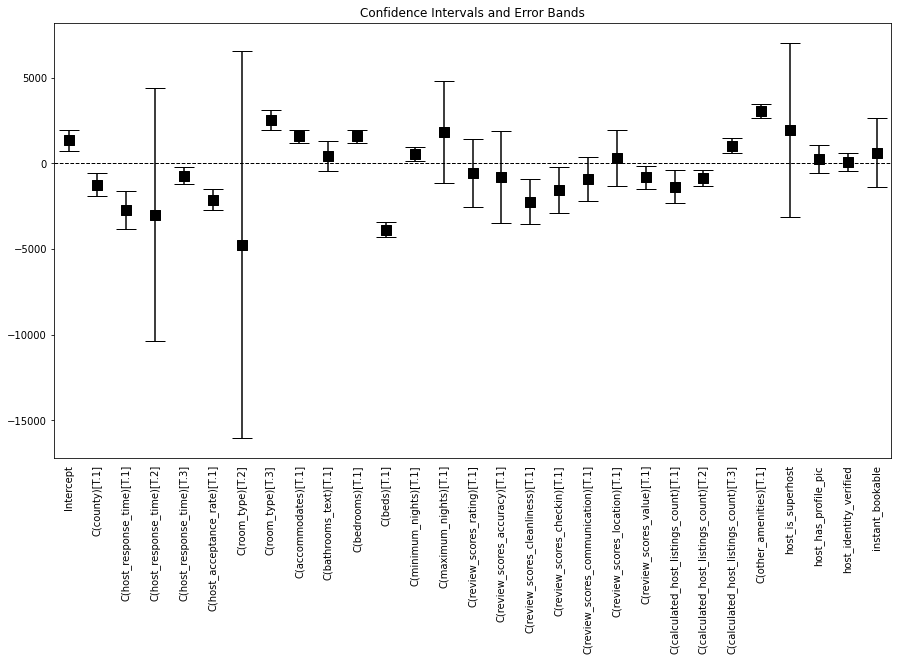

In [626]:
fig, ax = plt.subplots(figsize=(15, 8))
coef_df.plot(x='varname', y='coef', kind='bar', 
             ax=ax, color='none', capsize=10,
             yerr='err', legend=False)

ax.set_title('Confidence Intervals and Error Bands')
ax.set_ylabel('')
ax.set_xlabel('')
ax.scatter(x=pd.np.arange(coef_df.shape[0]), 
           marker='s', s=120, 
           y=coef_df['coef'], color='black')
ax.axhline(y=0, linestyle='--', color='black', linewidth=1)
ax.xaxis.set_ticks_position('none')
_ = ax.set_xticklabels(parmas, 
                       rotation=90)

In [627]:
test = listing_dame.copy()
test.host_is_superhost = listing_dame.host_is_superhost.astype('category')

In [628]:
source = test
axis_labels = ("datum.label == 0 ? 'Regular Hosts': 'Super Hosts'")

alt.Chart(source).mark_boxplot(clip=True, size=50, extent="min-max").encode(
    x=alt.X("host_is_superhost:O", title=None, axis=alt.Axis(labels=True, labelExpr=axis_labels, labelAngle=360)), 
    y=alt.Y('annual_listing_revenue:Q',title='Annual Listing Revenue ($)', scale=alt.Scale()),
    color=alt.Color('host_is_superhost', legend=None, scale=alt.Scale(scheme='dark2')),
).properties(
    width=300,
    height=300,
    title="Revenue generation for Regular and Super Hosts"

).configure_axis(
    labelFontSize=12,
    titleFontSize=12
)


alt.Chart(...)

In [629]:
source = test
axis_labels = ("datum.label == 0 ? 'Regular Hosts': 'Super Hosts'")

alt.Chart(source).mark_boxplot(clip=True, size=50, extent="min-max").encode(
    x=alt.X("host_is_superhost:O", title=None, axis=alt.Axis(labels=True, labelExpr=axis_labels, labelAngle=360)), 
    y=alt.Y('annual_listing_revenue:Q',title='Annual Listing Revenue ($)', scale=alt.Scale(domain=(0, 10000))),
    color=alt.Color('host_is_superhost', legend=None, scale=alt.Scale(scheme='dark2'))
).properties(
    width=300,
    height=300,
    title="Revenue generation for Regular and Super Hosts (Zoomed In View)"
).configure_axis(
    labelFontSize=12,
    titleFontSize=12
)


alt.Chart(...)

STARGAZER

In [631]:
from stargazer.stargazer import Stargazer
from IPython.core.display import HTML
stargazer = Stargazer([model])
stargazer.rename_covariates({'C(accommodates)[T.1]': 'Accommodates', 'C(bathrooms_text)[T.1]': 'Number of Bathrooms',
                             'C(bedrooms)[T.1]': 'Number of Bedrooms', 'C(beds)[T.1]':'Number of Beds',
                             'C(calculated_host_listings_count)[T.1]': 'Total listing of Host[T.1]',
                             'C(calculated_host_listings_count)[T.2]': 'Total listing of Host[T.2]',
                             'C(calculated_host_listings_count)[T.3]': 'Total listing of Host[T.3]',
                             'C(county)[T.1]': 'Florida','C(host_acceptance_rate)[T.1]': 'Acceptance Rate of Host',
                             'C(host_response_time)[T.1]': 'Response Time of Host[T.1]', 'C(host_response_time)[T.2]':
                             'Response Time of Host[T.2]', 'C(host_response_time)[T.3]': 'Response Time of Host[T.3]',
                             'C(maximum_nights)[T.1]': 'Maximum Night customer stays at listing', 'C(minimum_nights)[T.1]':
                             'Minimum Night customer stays at listing',
                             'C(other_amenities)[T.1]': 'Other Amenities', 'C(review_scores_accuracy)[T.1]': 'Review Score on Accuracy',
                             'C(review_scores_checkin)[T.1]': 'Review Score on Checkin','C(review_scores_cleanliness[T.1]': 'Review Score on Cleanliness',
                             'C(review_scores_communication)[T.1]': 'Review Score on Communication',
                             'C(review_scores_location)[T.1]': 'Review Score on Location',
                             'C(review_scores_rating)[T.1]': 'Overall Rating','essentials': 'Essentials',
                             'C(review_scores_value)[T.1]': 'Review Score on Value',
                             'C(room_type)[T.2]': 'Room Type[Private]', 'C(room_type)[T.3]': 'Room Type[Shared]',
                             'host_has_profile_pic': 'Host with a profile picture', 'host_identity_verified': 'Host Identity verified',
                             'host_is_superhost': 'Super Host', 'instant_bookable': 'Instant Booking available'
                             })
stargazer.covariate_order(['Intercept','host_is_superhost', 'C(county)[T.1]', 'C(room_type)[T.2]', 'C(room_type)[T.3]','C(accommodates)[T.1]',
                           'C(bathrooms_text)[T.1]', 'C(bedrooms)[T.1]', 'C(beds)[T.1]', 'essentials', 'C(other_amenities)[T.1]', 'instant_bookable',
                           'C(maximum_nights)[T.1]', 'C(minimum_nights)[T.1]', 'C(review_scores_accuracy)[T.1]',
                           'C(review_scores_checkin)[T.1]','C(review_scores_cleanliness)[T.1]','C(review_scores_communication)[T.1]', 
                           'C(review_scores_location)[T.1]', 'C(review_scores_rating)[T.1]', 'C(review_scores_value)[T.1]', 'host_has_profile_pic',
                           'host_identity_verified', 'C(calculated_host_listings_count)[T.1]', 'C(calculated_host_listings_count)[T.2]',
                           'C(calculated_host_listings_count)[T.3]', 'C(host_acceptance_rate)[T.1]', 'C(host_response_time)[T.1]', 
                           'C(host_response_time)[T.2]','C(host_response_time)[T.3]'])

HTML(stargazer.render_html())